# DATA EXPLORATION

In [2]:
import polars as pl
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from datetime import datetime
import folium
from folium import plugins


In [3]:
data=pl.read_csv("final_internship_data.csv")
data.head()

User ID,User Name,Driver Name,Car Condition,Weather,Traffic Condition,key,fare_amount,pickup_datetime,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,passenger_count,hour,day,month,weekday,year,jfk_dist,ewr_dist,lga_dist,sol_dist,nyc_dist,distance,bearing
str,str,str,str,str,str,str,f64,str,f64,f64,f64,f64,i64,i64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,f64
"""KHVrEVlD""","""Kimberly Adams""","""Amy Butler""","""Very Good""","""windy""","""Congested Traffic""","""2009-06-15 17:26:21.0000001""",4.5,"""2009-06-15 17:26:21""",-1.288826,0.710721,-1.288779,0.710563,1,17,15,6,0,2009,20.26584,55.176046,14.342611,34.543548,27.572573,1.030764,-2.918897
"""lPxIuEri""","""Justin Tapia""","""Hannah Zimmerman""","""Excellent""","""cloudy""","""Flow Traffic""","""2010-01-05 16:52:16.0000002""",16.9,"""2010-01-05 16:52:16""",-1.291824,0.710546,-1.291182,0.71178,1,16,5,1,1,2010,44.667679,31.832358,23.130775,15.125872,8.755732,8.450134,-0.375217
"""gsVN8JLS""","""Elizabeth Lopez""","""Amanda Jackson""","""Bad""","""stormy""","""Congested Traffic""","""2011-08-18 00:35:00.00000049""",5.7,"""2011-08-18 00:35:00""",-1.291242,0.711418,-1.291391,0.711231,2,0,18,8,3,2011,43.597686,33.712082,19.865289,17.722624,9.847344,1.389525,2.599961
"""9I7kWFgd""","""Steven Wilson""","""Amy Horn""","""Very Good""","""stormy""","""Flow Traffic""","""2012-04-21 04:30:42.0000001""",7.7,"""2012-04-21 04:30:42""",-1.291319,0.710927,-1.291396,0.711363,1,4,21,4,5,2012,42.642965,32.556289,21.063132,15.738963,7.703421,2.79927,0.133905
"""8QN5ZaGN""","""Alexander Andrews""","""Cassandra Larson""","""Bad""","""stormy""","""Congested Traffic""","""2010-03-09 07:51:00.000000135""",5.3,"""2010-03-09 07:51:00""",-1.290987,0.711536,-1.290787,0.711811,1,7,9,3,1,2010,43.329953,39.406828,15.219339,23.732406,15.600745,1.999157,-0.502703


In [4]:
print(data.dtypes)  # List of data types
print(data.shape) 
print(data.schema)  # Get the shape (rows, columns)

[String, String, String, String, String, String, String, Float64, String, Float64, Float64, Float64, Float64, Int64, Int64, Int64, Int64, Int64, Int64, Float64, Float64, Float64, Float64, Float64, Float64, Float64]
(500000, 26)
Schema({'User ID': String, 'User Name': String, 'Driver Name': String, 'Car Condition': String, 'Weather': String, 'Traffic Condition': String, 'key': String, 'fare_amount': Float64, 'pickup_datetime': String, 'pickup_longitude': Float64, 'pickup_latitude': Float64, 'dropoff_longitude': Float64, 'dropoff_latitude': Float64, 'passenger_count': Int64, 'hour': Int64, 'day': Int64, 'month': Int64, 'weekday': Int64, 'year': Int64, 'jfk_dist': Float64, 'ewr_dist': Float64, 'lga_dist': Float64, 'sol_dist': Float64, 'nyc_dist': Float64, 'distance': Float64, 'bearing': Float64})


In [5]:
summary = data.describe()
print(summary)

shape: (9, 27)
┌───────────┬──────────┬───────────┬───────────┬───┬───────────┬───────────┬───────────┬───────────┐
│ statistic ┆ User ID  ┆ User Name ┆ Driver    ┆ … ┆ sol_dist  ┆ nyc_dist  ┆ distance  ┆ bearing   │
│ ---       ┆ ---      ┆ ---       ┆ Name      ┆   ┆ ---       ┆ ---       ┆ ---       ┆ ---       │
│ str       ┆ str      ┆ str       ┆ ---       ┆   ┆ f64       ┆ f64       ┆ f64       ┆ f64       │
│           ┆          ┆           ┆ str       ┆   ┆           ┆           ┆           ┆           │
╞═══════════╪══════════╪═══════════╪═══════════╪═══╪═══════════╪═══════════╪═══════════╪═══════════╡
│ count     ┆ 500000   ┆ 500000    ┆ 500000    ┆ … ┆ 499995.0  ┆ 499995.0  ┆ 499995.0  ┆ 499995.0  │
│ null_coun ┆ 0        ┆ 0         ┆ 0         ┆ … ┆ 5.0       ┆ 5.0       ┆ 5.0       ┆ 5.0       │
│ t         ┆          ┆           ┆           ┆   ┆           ┆           ┆           ┆           │
│ mean      ┆ null     ┆ null      ┆ null      ┆ … ┆ 363.67403 ┆ 355.99142 ┆

In [5]:
columns_to_exclude = [
    'pickup_longitude', 'pickup_latitude', 
    'dropoff_longitude', 'dropoff_latitude',
    'User ID', 'User Name', 'Driver Name', 
    'key', 'pickup_datetime'
]
filtered_data = data.drop(columns_to_exclude)


In [6]:
num_ftr = filtered_data.select(pl.col(pl.NUMERIC_DTYPES))
print(num_ftr)

shape: (500_000, 14)
┌─────────────┬─────────────────┬──────┬─────┬───┬───────────┬───────────┬──────────┬───────────┐
│ fare_amount ┆ passenger_count ┆ hour ┆ day ┆ … ┆ sol_dist  ┆ nyc_dist  ┆ distance ┆ bearing   │
│ ---         ┆ ---             ┆ ---  ┆ --- ┆   ┆ ---       ┆ ---       ┆ ---      ┆ ---       │
│ f64         ┆ i64             ┆ i64  ┆ i64 ┆   ┆ f64       ┆ f64       ┆ f64      ┆ f64       │
╞═════════════╪═════════════════╪══════╪═════╪═══╪═══════════╪═══════════╪══════════╪═══════════╡
│ 4.5         ┆ 1               ┆ 17   ┆ 15  ┆ … ┆ 34.543548 ┆ 27.572573 ┆ 1.030764 ┆ -2.918897 │
│ 16.9        ┆ 1               ┆ 16   ┆ 5   ┆ … ┆ 15.125872 ┆ 8.755732  ┆ 8.450134 ┆ -0.375217 │
│ 5.7         ┆ 2               ┆ 0    ┆ 18  ┆ … ┆ 17.722624 ┆ 9.847344  ┆ 1.389525 ┆ 2.599961  │
│ 7.7         ┆ 1               ┆ 4    ┆ 21  ┆ … ┆ 15.738963 ┆ 7.703421  ┆ 2.79927  ┆ 0.133905  │
│ 5.3         ┆ 1               ┆ 7    ┆ 9   ┆ … ┆ 23.732406 ┆ 15.600745 ┆ 1.999157 ┆ -0.502703 │

/tmp/ipykernel_356/364771061.py:1: DeprecationWarning: `NUMERIC_DTYPES` is deprecated. Define your own data type groups or use the `polars.selectors` module for selecting columns of a certain data type.
  num_ftr = filtered_data.select(pl.col(pl.NUMERIC_DTYPES))


In [7]:
cat_ftr = filtered_data.select(pl.col(pl.Utf8))
print(cat_ftr)

shape: (500_000, 3)
┌───────────────┬─────────┬───────────────────┐
│ Car Condition ┆ Weather ┆ Traffic Condition │
│ ---           ┆ ---     ┆ ---               │
│ str           ┆ str     ┆ str               │
╞═══════════════╪═════════╪═══════════════════╡
│ Very Good     ┆ windy   ┆ Congested Traffic │
│ Excellent     ┆ cloudy  ┆ Flow Traffic      │
│ Bad           ┆ stormy  ┆ Congested Traffic │
│ Very Good     ┆ stormy  ┆ Flow Traffic      │
│ Bad           ┆ stormy  ┆ Congested Traffic │
│ …             ┆ …       ┆ …                 │
│ Bad           ┆ rainy   ┆ Dense Traffic     │
│ Very Good     ┆ rainy   ┆ Flow Traffic      │
│ Bad           ┆ rainy   ┆ Flow Traffic      │
│ Good          ┆ stormy  ┆ Congested Traffic │
│ Very Good     ┆ sunny   ┆ Flow Traffic      │
└───────────────┴─────────┴───────────────────┘


In [8]:
# Iterate over each categorical feature and print its value counts
for col in cat_ftr.columns:
    print(f"Value counts for {col}:")
    print(cat_ftr[col].value_counts())
    print()  # Add spacing between outputs

Value counts for Car Condition:
shape: (4, 2)
┌───────────────┬────────┐
│ Car Condition ┆ count  │
│ ---           ┆ ---    │
│ str           ┆ u32    │
╞═══════════════╪════════╡
│ Very Good     ┆ 125312 │
│ Bad           ┆ 124978 │
│ Good          ┆ 124968 │
│ Excellent     ┆ 124742 │
└───────────────┴────────┘

Value counts for Weather:
shape: (5, 2)
┌─────────┬────────┐
│ Weather ┆ count  │
│ ---     ┆ ---    │
│ str     ┆ u32    │
╞═════════╪════════╡
│ windy   ┆ 99578  │
│ rainy   ┆ 99972  │
│ cloudy  ┆ 100062 │
│ stormy  ┆ 99955  │
│ sunny   ┆ 100433 │
└─────────┴────────┘

Value counts for Traffic Condition:
shape: (3, 2)
┌───────────────────┬────────┐
│ Traffic Condition ┆ count  │
│ ---               ┆ ---    │
│ str               ┆ u32    │
╞═══════════════════╪════════╡
│ Dense Traffic     ┆ 166584 │
│ Flow Traffic      ┆ 166569 │
│ Congested Traffic ┆ 166847 │
└───────────────────┴────────┘



Conclude that there is no outliers in catigorical data , The values are almost evenly distributed

# UNIVARIATE ANALYSIS

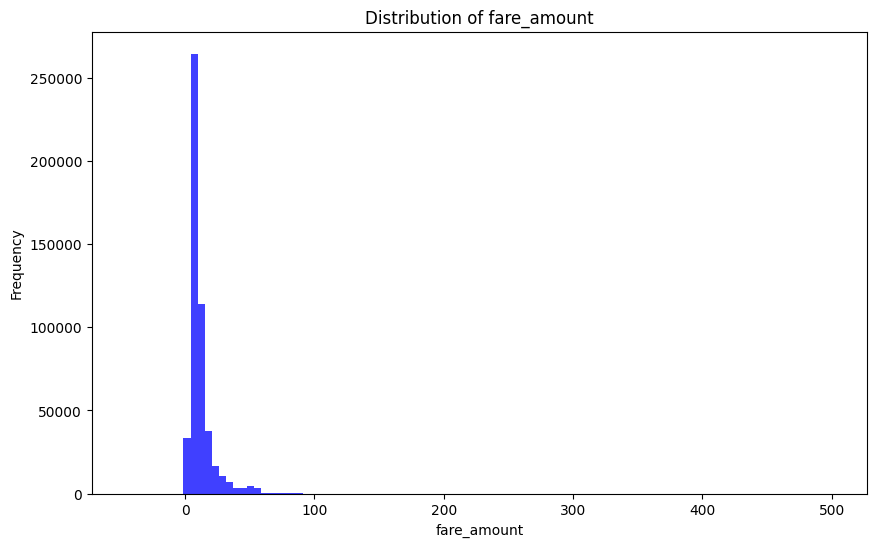

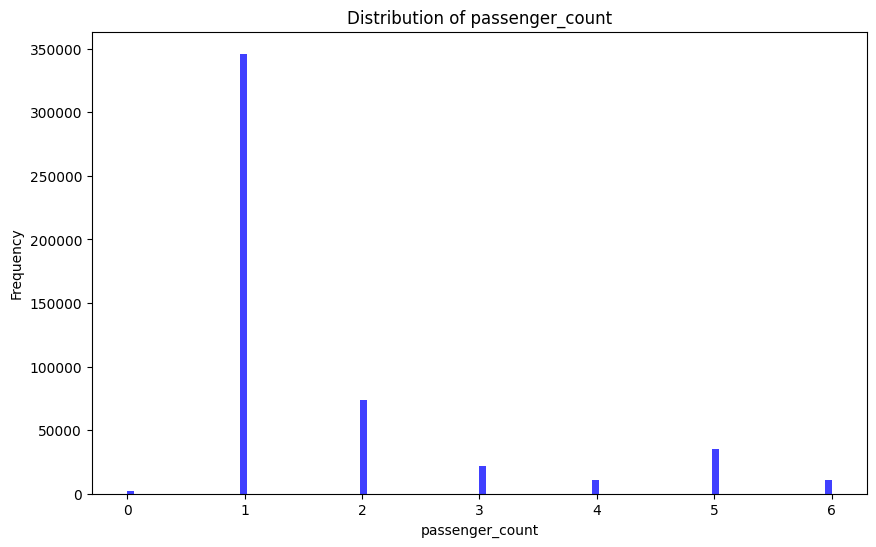

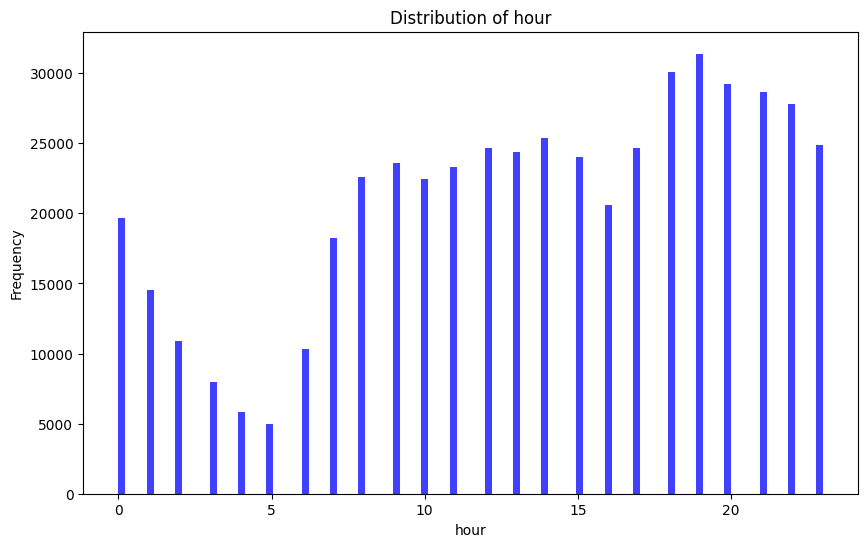

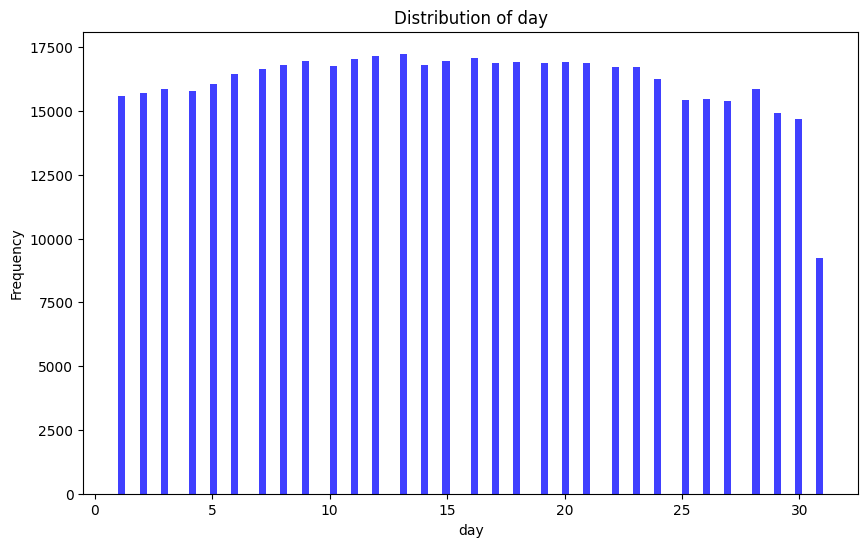

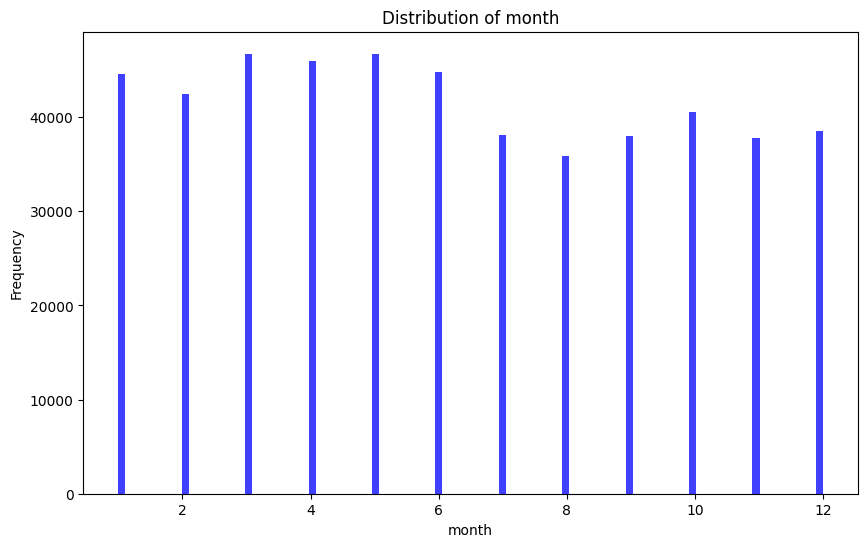

...

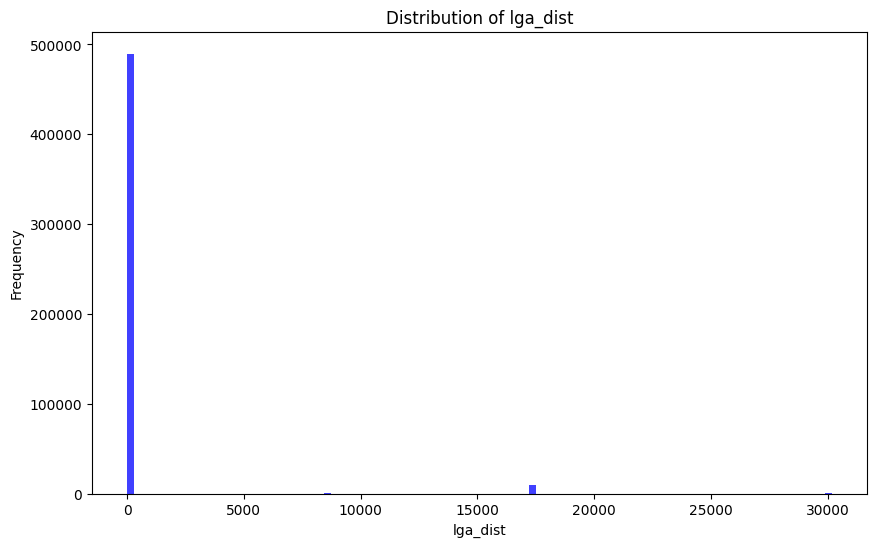

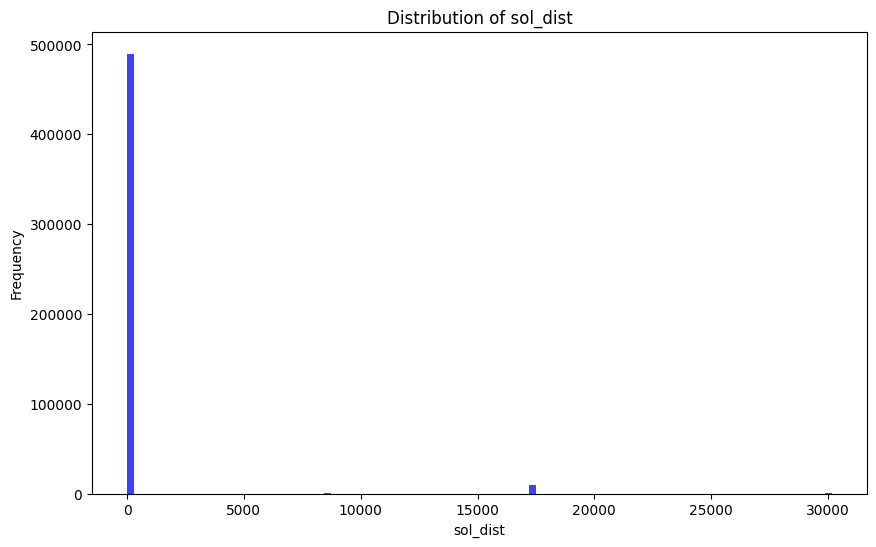

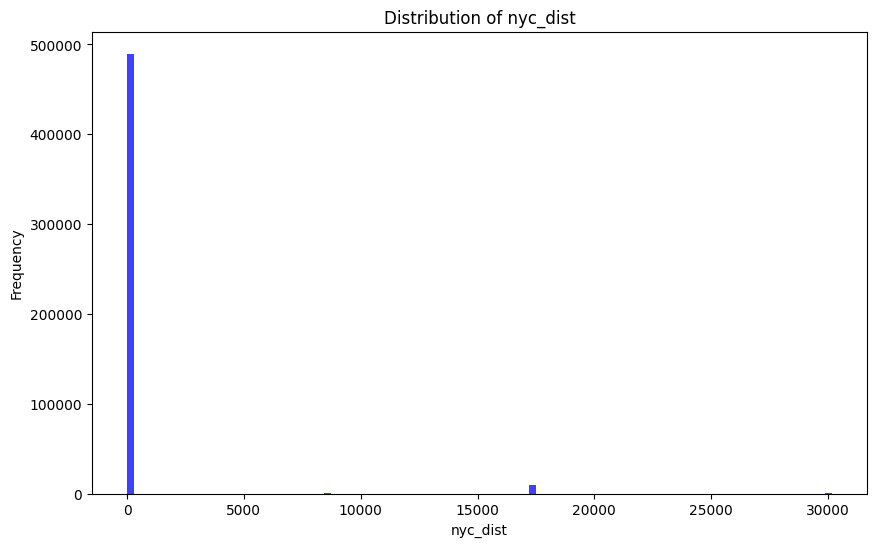

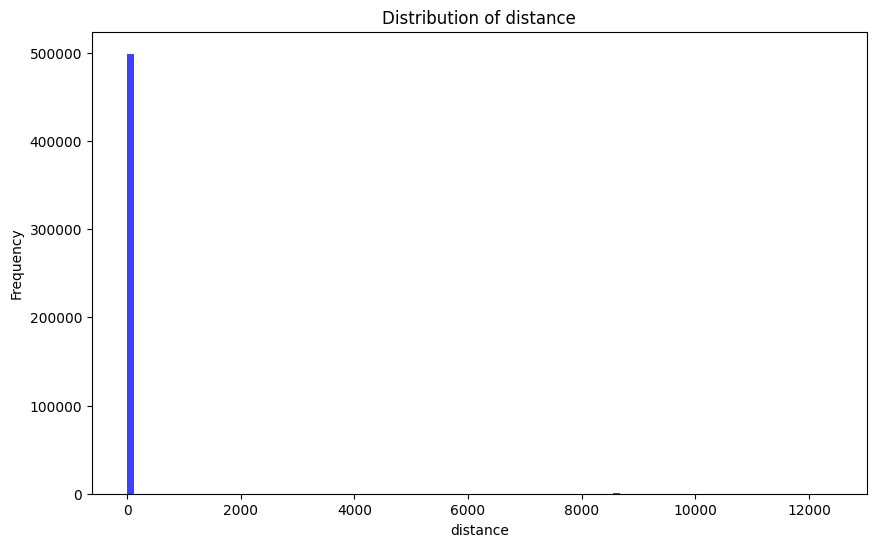

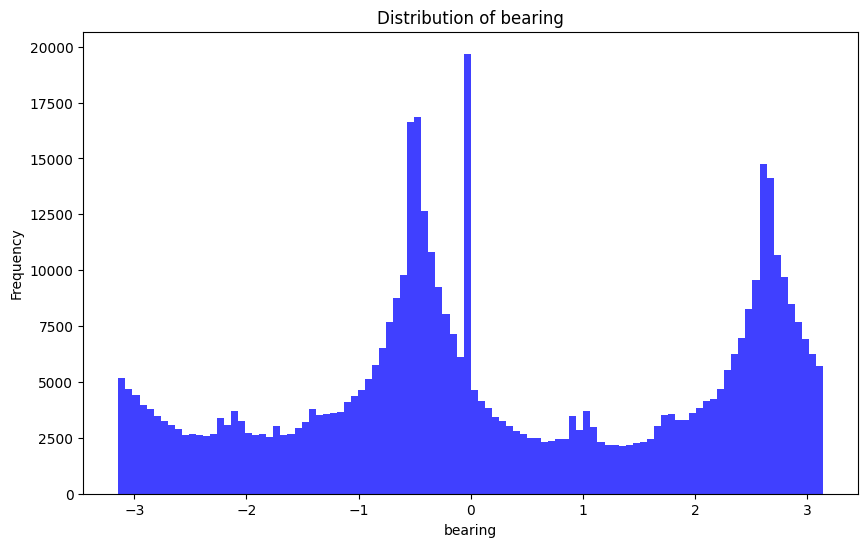

In [9]:

# Plot histograms for numeric features
for column in num_ftr.columns:
    plt.figure(figsize=(10, 6))
    # Convert Polars series to a NumPy array for plotting
    plt.hist(num_ftr[column].to_numpy(), bins=100, alpha=0.75, color='blue')
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


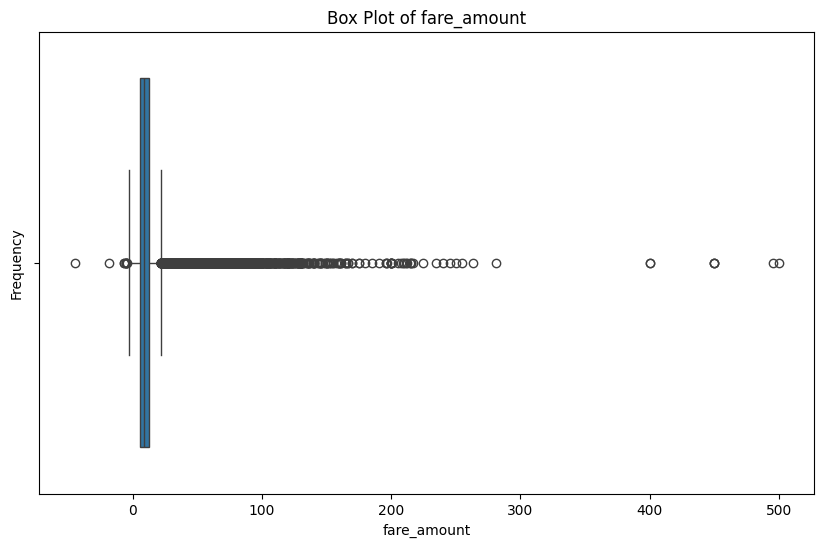

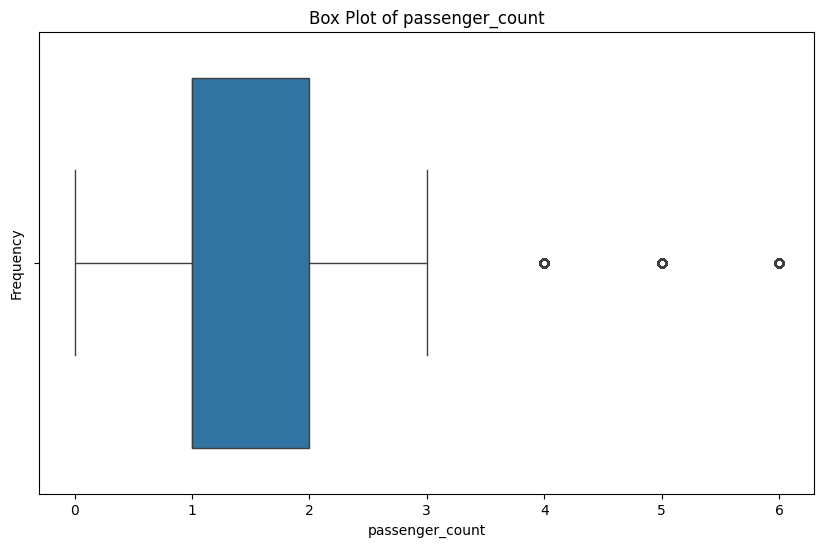

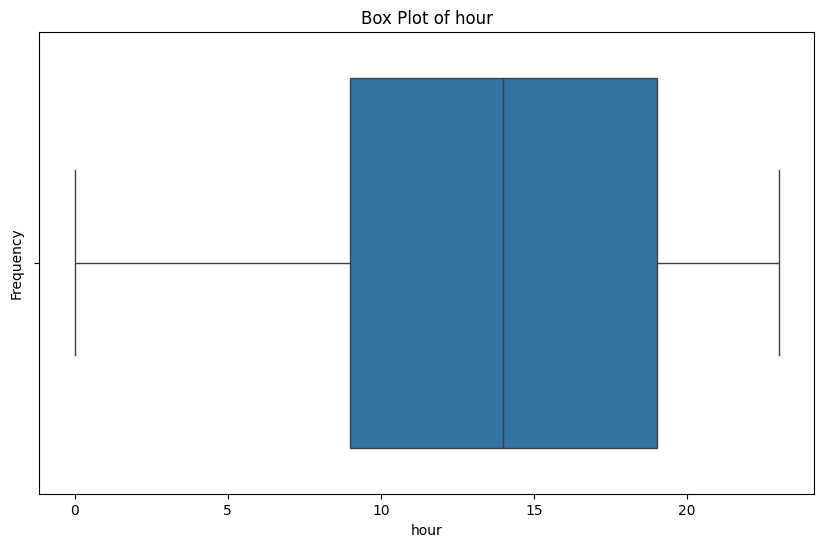

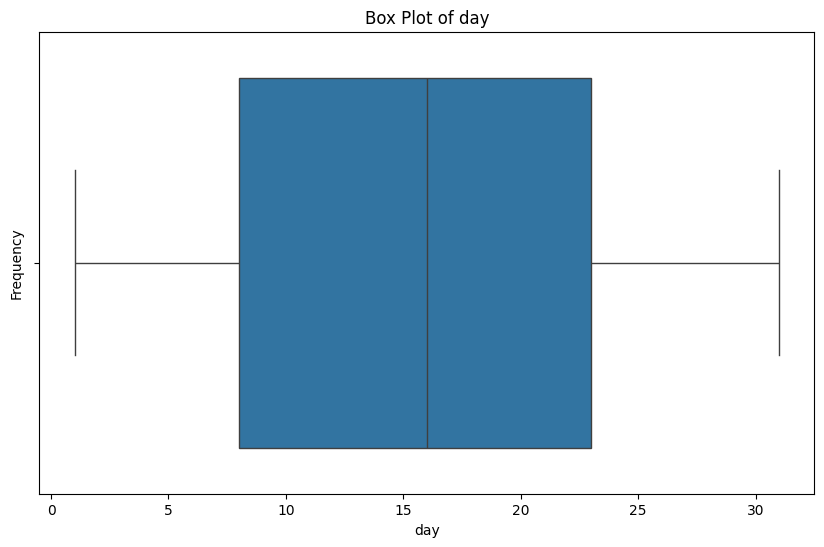

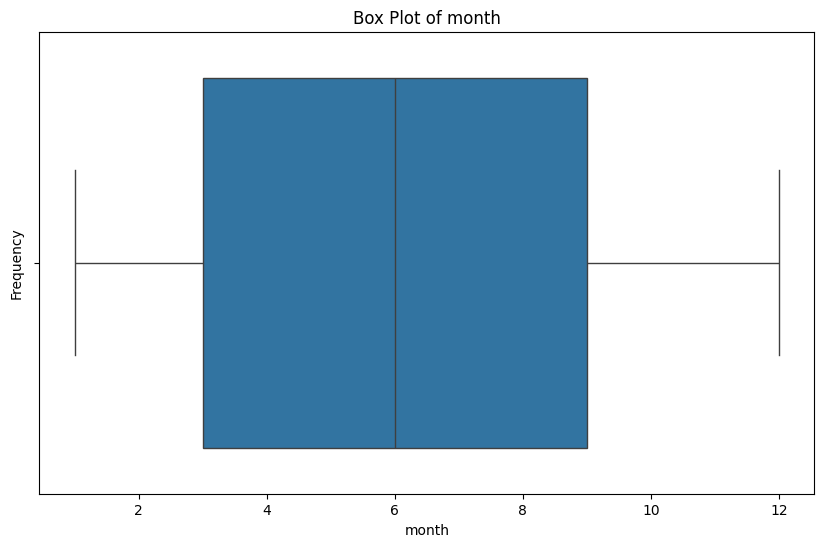

...

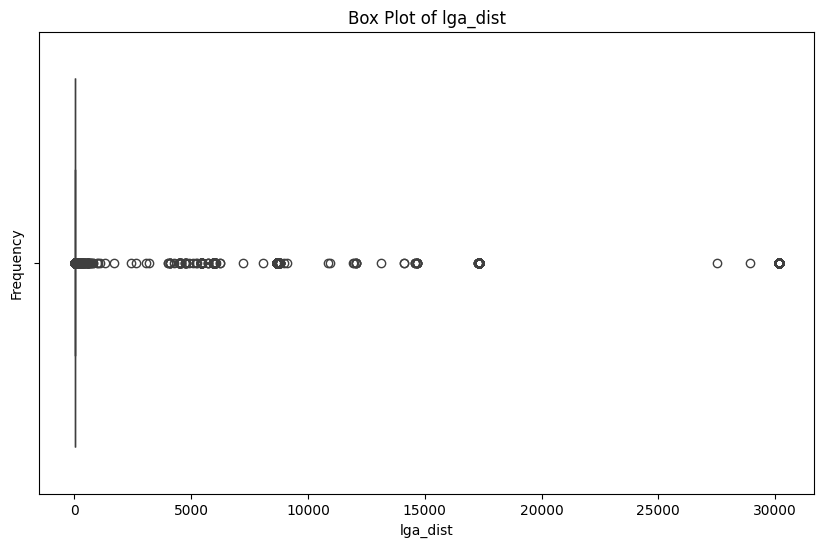

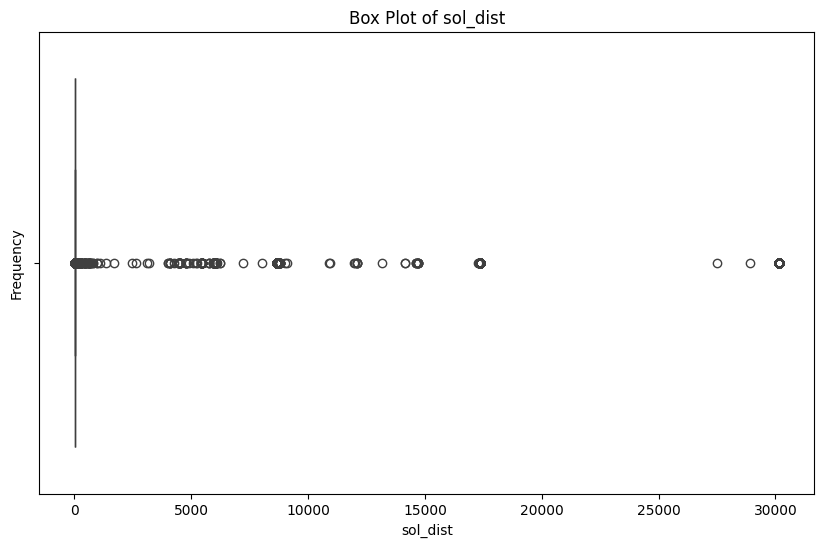

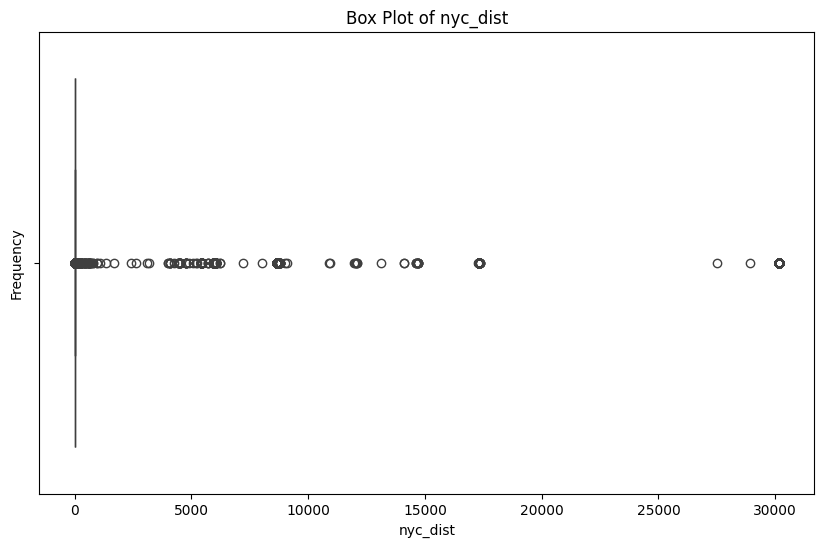

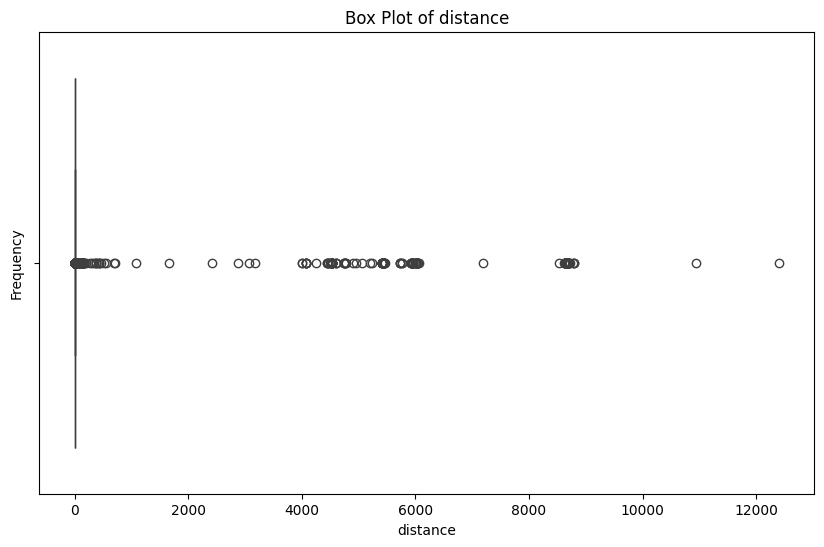

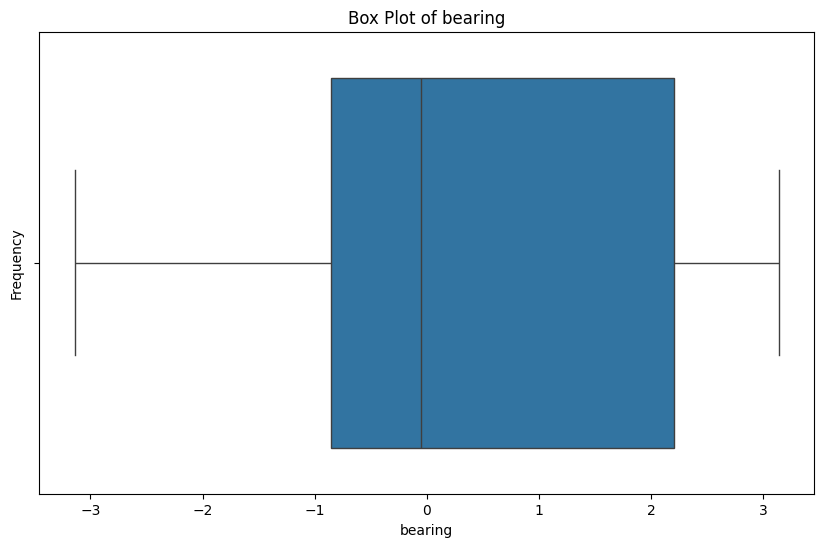

In [10]:
for column in num_ftr.columns:
    plt.figure(figsize=(10, 6))
    sns.boxplot(x=num_ftr[column])
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()


In [11]:
data.columns

['User ID',
 'User Name',
 'Driver Name',
 'Car Condition',
 'Weather',
 'Traffic Condition',
 'key',
 'fare_amount',
 'pickup_datetime',
 'pickup_longitude',
 'pickup_latitude',
 'dropoff_longitude',
 'dropoff_latitude',
 'passenger_count',
 'hour',
 'day',
 'month',
 'weekday',
 'year',
 'jfk_dist',
 'ewr_dist',
 'lga_dist',
 'sol_dist',
 'nyc_dist',
 'distance',
 'bearing']

In [6]:
def validate_coordinates(df: pl.DataFrame, return_invalid=False):
    coord_columns = ["pickup_longitude", "pickup_latitude", 
                     "dropoff_longitude", "dropoff_latitude"]
    
    # Ensure coordinates are within a valid range (example: longitude [-180, 180], latitude [-90, 90])
    valid_coords = (
        (df["pickup_longitude"].abs() <= 180) & 
        (df["pickup_latitude"].abs() <= 90) & 
        (df["dropoff_longitude"].abs() <= 180) & 
        (df["dropoff_latitude"].abs() <= 90)
    )

    # Apply rounding to coordinate columns
    df = df.with_columns([
        pl.col(col).round(6).alias(col) for col in coord_columns
    ])

    # Split into valid and invalid DataFrames
    valid_df = df.filter(valid_coords)
    invalid_df = df.filter(~valid_coords)
    
    if return_invalid:
        return valid_df, invalid_df
    return valid_df

# Example usage
cleaned_df, invalid_df = validate_coordinates(data, return_invalid=True)
print(f"Valid rows: {cleaned_df.shape}, Invalid rows: {invalid_df.shape}")
print(invalid_df.head(10))

Valid rows: (499995, 26), Invalid rows: (0, 26)
shape: (0, 26)
┌─────────┬───────────┬─────────────┬───────────────┬───┬──────────┬──────────┬──────────┬─────────┐
│ User ID ┆ User Name ┆ Driver Name ┆ Car Condition ┆ … ┆ sol_dist ┆ nyc_dist ┆ distance ┆ bearing │
│ ---     ┆ ---       ┆ ---         ┆ ---           ┆   ┆ ---      ┆ ---      ┆ ---      ┆ ---     │
│ str     ┆ str       ┆ str         ┆ str           ┆   ┆ f64      ┆ f64      ┆ f64      ┆ f64     │
╞═════════╪═══════════╪═════════════╪═══════════════╪═══╪══════════╪══════════╪══════════╪═════════╡
└─────────┴───────────┴─────────────┴───────────────┴───┴──────────┴──────────┴──────────┴─────────┘


In [7]:
import polars as pl
import plotly.graph_objects as go

def create_circular_hourly_analysis(df):
    """
    Creates a circular visualization showing hourly patterns
    """
    # Initialize lists to store hourly stats
    avg_fares = []
    ride_counts = []
    hours = range(24)  # Representing hours from 0 to 23

    # Calculate average fare and ride count by hour without using groupby
    for hour in hours:
        # Filter for the current hour
        hour_data = df.filter(pl.col("hour") == hour)
        
        # Calculate average fare and ride count
        avg_fare = hour_data.select(pl.mean("fare_amount")).to_numpy()[0][0] if hour_data.height > 0 else 0
        ride_count = hour_data.select(pl.count("User ID")).to_numpy()[0][0]

        avg_fares.append(avg_fare)
        ride_counts.append(ride_count)

    # Create circular plot
    fig = go.Figure()
    
    # Add traces
    fig.add_trace(go.Scatterpolar(
        r=avg_fares,
        theta=[hour * 15 for hour in hours],  # Convert to degrees
        name='Avg Fare',
        mode='lines+markers',
        line=dict(color='blue')
    ))
    
    fig.add_trace(go.Scatterpolar(
        r=[count / 1000 for count in ride_counts],  # Scale down for visualization
        theta=[hour * 15 for hour in hours],
        name='Ride Count (thousands)',
        mode='lines+markers',
        line=dict(color='red')
    ))
    
    fig.update_layout(
        title='24-Hour Circular Analysis of Taxi Rides',
        polar=dict(
            radialaxis=dict(showticklabels=True, ticksuffix=""),
            angularaxis=dict(
                ticktext=['12 AM', '3 AM', '6 AM', '9 AM', 
                          '12 PM', '3 PM', '6 PM', '9 PM'],
                tickvals=[0, 45, 90, 135, 180, 225, 270, 315],
            )
        )
    )
    return fig

# Assuming cleaned_df is a Polars DataFrame with 'hour', 'fare_amount', and 'User ID' columns
fig1 = create_circular_hourly_analysis(cleaned_df)
fig1.show()


In [14]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import polars as pl

def create_weather_impact_dashboard(df):
    """
    Creates a dashboard showing weather impact on various metrics using Polars DataFrame
    """
    fig = make_subplots(
        rows=2, cols=2,
        subplot_titles=('Fare by Weather & Traffic',
                       'Average Distance by Weather',
                       'Ride Distribution by Weather & Time',
                       'Weather Impact on Speed')
    )
    
    # 1. Box plot of fares by weather and traffic
    weather_fare = go.Box(
        x=df['Weather'].to_list(),
        y=df['fare_amount'].to_list(),
        name='Fares'
    )
    fig.add_trace(weather_fare, row=1, col=1)
    
    # 2. Average distance by weather
    unique_weather = df['Weather'].unique().to_list()
    weather_dist_x = []
    weather_dist_y = []
    
    for weather in unique_weather:
        avg_distance = df.filter(pl.col('Weather') == weather)['distance'].mean()
        weather_dist_x.append(weather)
        weather_dist_y.append(avg_distance)
    
    fig.add_trace(
        go.Bar(x=weather_dist_x, y=weather_dist_y),
        row=1, col=2
    )
    
    # 3. Heatmap of rides by weather and hour
    unique_hours = sorted(df['hour'].unique().to_list())
    weather_hour_matrix = []
    
    for hour in unique_hours:
        hour_counts = []
        for weather in unique_weather:
            count = df.filter(
                (pl.col('hour') == hour) & 
                (pl.col('Weather') == weather)
            ).height
            hour_counts.append(count)
        weather_hour_matrix.append(hour_counts)
    
    fig.add_trace(
        go.Heatmap(z=weather_hour_matrix,
                   x=unique_weather,
                   y=unique_hours),
        row=2, col=1
    )
    
    # 4. Average speed by weather
    # Fixed: Using / operator instead of divide()
    df = df.with_columns(
        (pl.col('distance') / pl.col('fare_amount')).alias('speed')
    )
    
    weather_speed_x = []
    weather_speed_y = []
    
    for weather in unique_weather:
        avg_speed = df.filter(pl.col('Weather') == weather)['speed'].mean()
        weather_speed_x.append(weather)
        weather_speed_y.append(avg_speed)
    
    fig.add_trace(
        go.Scatter(x=weather_speed_x,
                  y=weather_speed_y,
                  mode='lines+markers'),
        row=2, col=2
    )
    
    fig.update_layout(height=800, title_text="Weather Impact Analysis Dashboard")
    return fig
fig2 = create_weather_impact_dashboard(cleaned_df)
fig2.show()

In [15]:
import polars as pl
from plotly.subplots import make_subplots
import plotly.graph_objects as go

def calculate_condition_fare_stats(df):
    """
    Calculates average fare and standard deviation by car condition
    """
    stats = (df.group_by(['Car Condition', 'Weather'])
            .agg(pl.col('fare_amount').mean())
            .group_by('Car Condition')
            .agg([
                pl.col('fare_amount').mean().alias('mean_fare'),
                pl.col('fare_amount').std().alias('std_fare')
            ]))
    
    return (stats['Car Condition'].to_list(),
            stats['mean_fare'].to_list(),
            stats['std_fare'].to_list())

def create_condition_fare_bar(conditions, means, stds):
    """
    Creates a bar chart of average fares by car condition
    """
    return go.Bar(
        x=conditions,
        y=means,
        error_y=dict(
            type='data',
            array=stds
        )
    )

def calculate_customer_distribution(df):
    """
    Calculates customer distribution by car condition
    """
    distribution = (df.group_by('Car Condition')
                   .agg(pl.count())
                   .sort('count', descending=True))
    
    return distribution['Car Condition'].to_list(), distribution['count'].to_list()

def create_customer_pie(labels, values):
    """
    Creates a pie chart of customer distribution
    """
    return go.Pie(
        values=values,
        labels=labels
    )

def create_distance_box(df):
    """
    Creates a box plot of distance distribution by car condition
    """
    return go.Box(
        x=df['Car Condition'].to_list(),
        y=df['distance'].to_list(),
        name='Distance Distribution'
    )

def calculate_traffic_impact(df):
    """
    Calculates traffic impact on fares by car condition
    """
    impact = (df.group_by(['Car Condition', 'Traffic Condition'])
             .agg(pl.col('fare_amount').mean())
             .pivot(
                 values='fare_amount',
                 index='Car Condition',
                 columns='Traffic Condition'
             ))
    
    conditions = impact['Car Condition'].to_list()
    traffic_conditions = [col for col in impact.columns if col != 'Car Condition']
    values = impact.select(traffic_conditions).to_numpy()
    
    return values, traffic_conditions, conditions

def create_traffic_heatmap(values, x_labels, y_labels):
    """
    Creates a heatmap of traffic impact
    """
    return go.Heatmap(
        z=values,
        x=x_labels,
        y=y_labels
    )

def create_car_condition_analysis(df):
    """
    Creates an analysis of car condition impact using Polars
    """
    # Create subplot layout with correct specifications
    fig = make_subplots(
        rows=2, cols=2,
        specs=[
            [{"type": "xy"}, {"type": "domain"}],  # First row: regular plot and pie chart
            [{"type": "xy"}, {"type": "xy"}]       # Second row: regular plots
        ],
        subplot_titles=('Average Fare by Car Condition',
                       'Customer Distribution',
                       'Distance Analysis',
                       'Traffic Impact')
    )
    
    # 1. Average fare by car condition and weather
    conditions, means, stds = calculate_condition_fare_stats(df)
    fig.add_trace(
        create_condition_fare_bar(conditions, means, stds),
        row=1, col=1
    )
    
    # 2. Customer distribution by car condition
    cust_labels, cust_values = calculate_customer_distribution(df)
    fig.add_trace(
        create_customer_pie(cust_labels, cust_values),
        row=1, col=2
    )
    
    # 3. Distance analysis
    fig.add_trace(
        create_distance_box(df),
        row=2, col=1
    )
    
    # 4. Traffic condition impact
    impact_values, traffic_conditions, car_conditions = calculate_traffic_impact(df)
    fig.add_trace(
        create_traffic_heatmap(impact_values, traffic_conditions, car_conditions),
        row=2, col=2
    )
    
    fig.update_layout(height=800, title_text="Car Condition Impact Analysis")
    return fig

# Example usage:
# fig3 = create_car_condition_analysis(cleaned_df)
# fig3.show()

In [ ]:
fig3 = create_car_condition_analysis(cleaned_df)
fig3.show()

/tmp/ipykernel_356/1161675570.py:39: DeprecationWarning:

`pl.count()` is deprecated. Please use `pl.len()` instead.

/tmp/ipykernel_356/1161675570.py:69: DeprecationWarning:

The argument `columns` for `DataFrame.pivot` is deprecated. It has been renamed to `on`.



In [20]:
def create_ride_map(df):
    """
    Create an interactive map showing taxi rides with pickup and dropoff points
    
    Parameters:
    df (pandas.DataFrame): DataFrame containing pickup and dropoff coordinates
    
    Returns:
    folium.Map: Interactive map object with ride visualizations
    """
    # Calculate center of map (average of all coordinates)
    center_lat = (df['pickup_latitude'].mean() + df['dropoff_latitude'].mean()) / 2
    center_lon = (df['pickup_longitude'].mean() + df['dropoff_longitude'].mean()) / 2
    
    # Create base map
    m = folium.Map(location=[center_lat, center_lon], 
                   zoom_start=11,
                   tiles='cartodbpositron')
    
    # Create feature group for better performance
    rides = folium.FeatureGroup(name='Rides')
    
    # Add rides to map (limit to first 1000 rides for performance)
    for idx, row in df.head(1000).iterrows():
        # Draw line between pickup and dropoff
        points = [
            (row['pickup_latitude'], row['pickup_longitude']),
            (row['dropoff_latitude'], row['dropoff_longitude'])
        ]
        
        # Create line with popup showing ride details
        folium.PolyLine(
            points,
            weight=2,
            color='blue',
            opacity=0.6,
            popup=f"Ride {idx}"
        ).add_to(rides)
        
        # Add pickup marker
        folium.CircleMarker(
            location=(row['pickup_latitude'], row['pickup_longitude']),
            radius=3,
            color='green',
            fill=True,
            popup='Pickup'
        ).add_to(rides)
        
        # Add dropoff marker
        folium.CircleMarker(
            location=(row['dropoff_latitude'], row['dropoff_longitude']),
            radius=3,
            color='red',
            fill=True,
            popup='Dropoff'
        ).add_to(rides)
    
    # Add heatmap of pickup locations
    pickup_points = df[['pickup_latitude', 'pickup_longitude']].values.tolist()
    plugins.HeatMap(pickup_points, radius=15).add_to(m)
    
    # Add the feature group to map
    rides.add_to(m)
    
    # Add layer control
    folium.LayerControl().add_to(m)
    
    return m

# Example usage:
#m = create_ride_map(cleaned_df)
#m.save('taxi_rides_map.html')

In [14]:
import polars as pl
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.cluster import KMeans
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt

def create_knn_model_with_clusters(df: pl.DataFrame):
    # Select relevant features for the model
    features = ['distance', 'passenger_count', 'hour', 'weekday']
    
    # Convert Polars DataFrame to numpy arrays for scikit-learn
    X = df.select(features).to_numpy()
    y = df.select('fare_amount').to_numpy().ravel()
    
    # Split the data
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
    
    # Scale the features
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Create clusters using KMeans
    kmeans = KMeans(n_clusters=3, random_state=42)
    train_clusters = kmeans.fit_predict(X_train_scaled)
    test_clusters = kmeans.predict(X_test_scaled)
    
    # Create and train the KNN model
    knn = KNeighborsRegressor(n_neighbors=3)
    knn.fit(X_train_scaled, y_train)
    
    # Make predictions
    y_pred = knn.predict(X_test_scaled)
    
    # Calculate metrics
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    # Convert test data back to arrays for plotting
    distance = X_test[:, 0]  # distance is first feature
    passenger_count = X_test[:, 1]  # passenger_count is second feature
    hour = X_test[:, 2]  # hour is third feature
    
    # Set up colors for clusters
    colors = ['#FF9999', '#66B2FF', '#99FF99']
    
    # Create visualizations
    plt.figure(figsize=(20, 15))
    
    # 1. Distance vs Fare with clusters
    plt.subplot(2, 2, 1)
    for i in range(3):
        cluster_mask = test_clusters == i
        plt.scatter(distance[cluster_mask], 
                   y_test[cluster_mask],
                   c=colors[i], 
                   label=f'Cluster {i+1}',
                   alpha=0.6)
    plt.xlabel('Distance')
    plt.ylabel('Fare Amount')
    plt.title('Distance vs Fare by Cluster')
    plt.legend()
    
    # 2. Hour vs Fare with clusters
    plt.subplot(2, 2, 2)
    for i in range(3):
        cluster_mask = test_clusters == i
        plt.scatter(hour[cluster_mask], 
                   y_test[cluster_mask],
                   c=colors[i], 
                   label=f'Cluster {i+1}',
                   alpha=0.6)
    plt.xlabel('Hour of Day')
    plt.ylabel('Fare Amount')
    plt.title('Hour vs Fare by Cluster')
    plt.legend()
    
    # 3. Passenger Count vs Fare with clusters
    plt.subplot(2, 2, 3)
    for i in range(3):
        cluster_mask = test_clusters == i
        plt.scatter(passenger_count[cluster_mask], 
                   y_test[cluster_mask],
                   c=colors[i], 
                   label=f'Cluster {i+1}',
                   alpha=0.6)
    plt.xlabel('Passenger Count')
    plt.ylabel('Fare Amount')
    plt.title('Passenger Count vs Fare by Cluster')
    plt.legend()
    
    # 4. Actual vs Predicted with clusters
    plt.subplot(2, 2, 4)
    for i in range(3):
        cluster_mask = test_clusters == i
        plt.scatter(y_test[cluster_mask], 
                   y_pred[cluster_mask],
                   c=colors[i], 
                   label=f'Cluster {i+1}',
                   alpha=0.6)
    plt.plot([y_test.min(), y_test.max()], 
             [y_test.min(), y_test.max()], 
             'k--', 
             lw=2,
             label='Perfect Prediction')
    plt.xlabel('Actual Fare')
    plt.ylabel('Predicted Fare')
    plt.title('Actual vs Predicted Fares by Cluster')
    plt.legend()
    
    plt.tight_layout()
    
    # Print metrics
    print("\nModel Performance Metrics:")
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"R² Score: {r2:.2f}")
    
    # Print cluster statistics
    print("\nCluster Statistics:")
    for i in range(3):
        cluster_mask = test_clusters == i
        cluster_distances = distance[cluster_mask]
        cluster_fares = y_test[cluster_mask]
        
        print(f"\nCluster {i+1}:")
        print(f"Average Distance: {np.mean(cluster_distances):.2f}")
        print(f"Average Fare: {np.mean(cluster_fares):.2f}")
        print(f"Number of rides: {np.sum(cluster_mask)}")
    
    return knn, scaler, kmeans

def predict_fare_with_cluster(model, scaler, kmeans, new_data: pl.DataFrame):
    """
    Make predictions for new data points and assign clusters
    new_data should contain: distance, passenger_count, hour, weekday
    """
    # Convert Polars DataFrame to numpy array
    features = ['distance', 'passenger_count', 'hour', 'weekday']
    new_data_array = new_data.select(features).to_numpy()
    
    scaled_data = scaler.transform(new_data_array)
    cluster = kmeans.predict(scaled_data)
    prediction = model.predict(scaled_data)
    
    return prediction, cluster

# Example usage:
"""
# Initialize your Polars DataFrame
df = pl.DataFrame(...)

# Train the model and create visualizations
knn_model, scaler, kmeans = create_knn_model_with_clusters(df)

# Make predictions for new data
new_data = pl.DataFrame({
    'distance': [5.0],
    'passenger_count': [2],
    'hour': [14],
    'weekday': [3]
})
predicted_fare, predicted_cluster = predict_fare_with_cluster(knn_model, scaler, kmeans, new_data)
"""

"\n# Initialize your Polars DataFrame\ndf = pl.DataFrame(...)\n\n# Train the model and create visualizations\nknn_model, scaler, kmeans = create_knn_model_with_clusters(df)\n\n# Make predictions for new data\nnew_data = pl.DataFrame({\n    'distance': [5.0],\n    'passenger_count': [2],\n    'hour': [14],\n    'weekday': [3]\n})\npredicted_fare, predicted_cluster = predict_fare_with_cluster(knn_model, scaler, kmeans, new_data)\n"


Model Performance Metrics:
Mean Squared Error: 36.21
R² Score: 0.63

Cluster Statistics:

Cluster 1:
Average Distance: 13.44
Average Fare: 11.47
Number of rides: 31546

Cluster 2:
Average Distance: 23.14
Average Fare: 11.50
Number of rides: 28932

Cluster 3:
Average Distance: 26.81
Average Fare: 11.31
Number of rides: 39521


(KNeighborsRegressor(n_neighbors=3),
 StandardScaler(),
 KMeans(n_clusters=3, random_state=42))

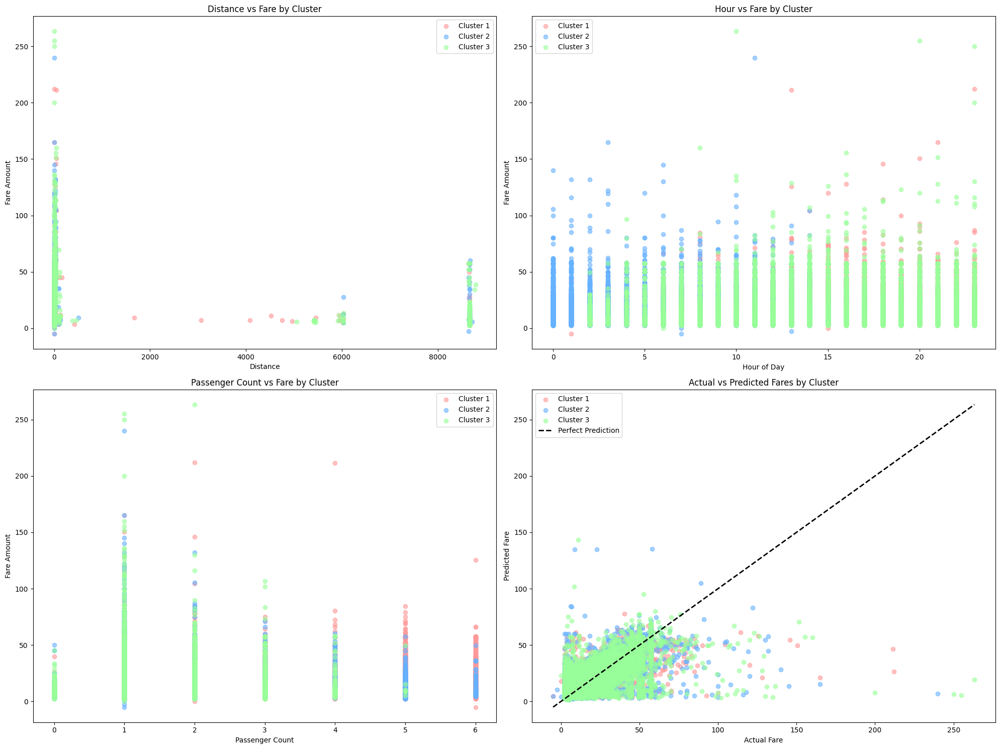

In [15]:
create_knn_model_with_clusters(cleaned_df)